<a href="https://colab.research.google.com/github/titsitits/Test_images_superresolution/blob/master/Super_resolution_comparison.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction
Test images will be put in folder '/content/MyImages'
Acceptable images for most algorithms should be in png format. The acceptable size depends on your GPU, on the model you are trying and on the scaling option. Some algorithms allow chopping strategy to allow the use of larger images. Images around 500x500 should work in most cases with Google colab Tesla T4. Images around 1000x1000 won't work with some models, especially with a very large scaling option (like x8). It could work with SRFBN x4, WDSR x4 and DBPN x4.

In [1]:
import os
os.chdir('/content/')
!rm -r '/content/MyImages'
!mkdir '/content/MyImages'

rm: cannot remove '/content/MyImages': No such file or directory


In [2]:
import os
os.chdir('/content/')
!rm -r '/content/Myresults'
!mkdir '/content/Myresults'

rm: cannot remove '/content/Myresults': No such file or directory


In [0]:
#Download some example images (you can also put your own images manually in the right folder)
import os
os.chdir('/content/MyImages')

#!wget -O 'landscape.png' 'https://static-s.aa-cdn.net/img/gp/20600002404286/pRD2XG5X2KqiDoA4L1eNJFlN4_7ghS8cPiMux_wWEDVKzASYPJSsSMQ6580qan62ydRV=w300?v=1'
!wget -O 'trump.png' 'https://pbs.twimg.com/profile_images/651817654039130112/yBuDxvGl.png'
!wget -O 'vangogh2.png' 'https://i.downloadatoz.com/download/icon2/4/b/6/5ffb8c5efbe586dcb44ec4493e8b4a67.jpg'
!wget -O 'animals.png' 'https://images.discordapp.net/avatars/555843452886319141/5577794e29af98657acd2b6076ee2a99.png?size=512'
!wget -O 'lion.png'  'https://cdn130.picsart.com/239219449097202.png?c256x256'

!wget -O 'island.jpg' 'https://upload.wikimedia.org/wikipedia/commons/thumb/9/90/USA_Guam_satellite_image_location_map.jpg/256px-USA_Guam_satellite_image_location_map.jpg'
!wget -O 'landscape.jpg' 'https://upload.wikimedia.org/wikipedia/commons/thumb/3/33/Showing_hike_to_Bawangaja_ji.JPG/256px-Showing_hike_to_Bawangaja_ji.JPG'

#Cifar sample (very small images for fast testing)
!wget -O "airplane.png" 'https://www.cs.toronto.edu/~kriz/cifar-10-sample/airplane1.png'
!wget -O "automobile.png" 'https://www.cs.toronto.edu/~kriz/cifar-10-sample/automobile1.png'
!wget -O "bird.png" 'https://www.cs.toronto.edu/~kriz/cifar-10-sample/bird1.png'
!wget -O "cat.png" 'https://www.cs.toronto.edu/~kriz/cifar-10-sample/cat1.png'
!wget -O "deer.png" 'https://www.cs.toronto.edu/~kriz/cifar-10-sample/deer1.png'
!wget -O "horse.png" 'https://www.cs.toronto.edu/~kriz/cifar-10-sample/horse1.png'
!wget -O "dog.png" 'https://www.cs.toronto.edu/~kriz/cifar-10-sample/dog1.png'
!wget -O "frog.png" 'https://www.cs.toronto.edu/~kriz/cifar-10-sample/frog1.png'
!wget -O "ship.png" 'https://www.cs.toronto.edu/~kriz/cifar-10-sample/ship1.png'
!wget -O "truck.png" 'https://www.cs.toronto.edu/~kriz/cifar-10-sample/truck1.png'



#TODO: the images downloaded with wget don't seem to work with SRFBN so far... If you want to test SRFBN you need to upload images manually

In [0]:
#convert all images in a compatible format for most models 
from PIL import Image
import glob
for myfile in glob.glob('/content/MyImages/*'):
  f, e = os.path.splitext(myfile)
  myim = Image.open(myfile)
  os.remove(myfile)
  myim.save(f+".png")

# WDSR - EDSR - SRGAN - "Keras-based implementation of WDSR, EDSR and SRGAN for single image super-resolution "
https://github.com/krasserm/super-resolution

   - Wide Activation for Efficient and Accurate Image Super-Resolution (WDSR), winner of the NTIRE 2018 super-resolution challenge.
   - Enhanced Deep Residual Networks for Single Image Super-Resolution (EDSR), winner of the NTIRE 2017 super-resolution challenge.
   - Photo-Realistic Single Image Super-Resolution Using a Generative Adversarial Network (SRGAN).


In [9]:
import os
os.chdir('/content')
!git clone "https://github.com/krasserm/super-resolution"

Cloning into 'super-resolution'...
remote: Enumerating objects: 1, done.
remote: Counting objects: 100% (1/1), done.
remote: Total 238 (delta 0), reused 0 (delta 0), pack-reused 237
Receiving objects: 100% (238/238), 27.97 MiB | 20.88 MiB/s, done.
Resolving deltas: 100% (122/122), done.


In [0]:
import os
os.chdir('/content/super-resolution')

In [11]:
# Download models
import os
os.chdir('/content/super-resolution/model')
#baseline (EDSR)
!wget -O 'edsr-16-x2-psnr-34.6356.h5' --no-check-certificate "https://docs.google.com/uc?export=download&id=1oATD-iXlQpcE2mIIEd4-9FOk2Xt5N8oX"
#lightest model
!wget -O 'wdsr-a-16-x2-psnr-34.6816.h5' --no-check-certificate "https://docs.google.com/uc?export=download&id=1WmuSpNamFSszQOafrno05o1nDN4QjMeq"
#best PSNR
!wget -O 'wdsr-a-32-x2-psnr-34.8033.h5' --no-check-certificate "https://docs.google.com/uc?export=download&id=1V4XHMFZo35yB_NTaD0dyw1_plS-78-Ju"
!wget -O 'wdsr-a-32-x4-psnr-29.1736.h5' --no-check-certificate "https://docs.google.com/uc?export=download&id=1ZTIz1YVXFTI2z3rvBfVuBSthJLJZivxC"
#srgan with edsr generator (pre-trained and fine-tuned) (edsr gives the psnr, the gan ensures the photo is realistic)
!wget -O 'edsr-16-x4-gen-pre-psnr-28.8885.h5' --no-check-certificate "https://docs.google.com/uc?export=download&id=1V4XHMFZo35yB_NTaD0dyw1_plS-78-Ju"
!wget -O 'edsr-16-x4-gen-epoch-088.h5' --no-check-certificate "https://docs.google.com/uc?export=download&id=1Z7PhioyvTzLBOdrg6c4RNEP9JEIqudwP"


os.chdir('../')

--2019-05-24 08:24:10--  https://docs.google.com/uc?export=download&id=1oATD-iXlQpcE2mIIEd4-9FOk2Xt5N8oX
Resolving docs.google.com (docs.google.com)... 173.194.69.138, 173.194.69.113, 173.194.69.139, ...
Connecting to docs.google.com (docs.google.com)|173.194.69.138|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-14-7s-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/aed2dartnh5r61pfslm3j66h3k7uqhfs/1558684800000/06411213533590006419/*/1oATD-iXlQpcE2mIIEd4-9FOk2Xt5N8oX?e=download [following]
--2019-05-24 08:24:12--  https://doc-14-7s-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/aed2dartnh5r61pfslm3j66h3k7uqhfs/1558684800000/06411213533590006419/*/1oATD-iXlQpcE2mIIEd4-9FOk2Xt5N8oX?e=download
Resolving doc-14-7s-docs.googleusercontent.com (doc-14-7s-docs.googleusercontent.com)... 108.177.126.132, 2a00:1450:4013:c01::84
Connecting to doc-14-7s-docs.googleusercontent.com (doc-14-7s-

Upload model in super-resolution folder

In [12]:
import os
os.chdir('/content/super-resolution')

!python demo.py -i /content/MyImages -o ./output_edsr_x2 --model ./model/edsr-16-x2-psnr-34.6356.h5
!mkdir -p /content/Myresults/output_edsr_x2/
!cp ./output_edsr_x2/*.png /content/Myresults/output_edsr_x2/

!python demo.py -i /content/MyImages -o ./output_wdsr_x2 --model ./model/wdsr-a-16-x2-psnr-34.6816.h5
!mkdir -p /content/Myresults/output_wdsr_x2/
!cp ./output_wdsr_x2/*.png /content/Myresults/output_wdsr_x2/

!python demo.py -i /content/MyImages -o ./output_wdsr_x4 --model ./model/wdsr-a-32-x4-psnr-29.1736.h5
!mkdir -p /content/Myresults/output_wdsr_x4/
!cp ./output_wdsr_x4/*.png /content/Myresults/output_wdsr_x4/

!python demo.py -i /content/MyImages -o ./srgan_x4 --model ./model/edsr-16-x4-gen-epoch-088.h5
!mkdir -p /content/Myresults/srgan_x4/
!cp ./srgan_x4/*.png /content/Myresults/srgan_x4/

Using TensorFlow backend.
2019-05-24 08:24:34.144678: I tensorflow/core/platform/profile_utils/cpu_utils.cc:94] CPU Frequency: 2300000000 Hz
2019-05-24 08:24:34.145070: I tensorflow/compiler/xla/service/service.cc:150] XLA service 0x22fd1e0 executing computations on platform Host. Devices:
2019-05-24 08:24:34.145106: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (0): <undefined>, <undefined>
2019-05-24 08:24:34.323263: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2019-05-24 08:24:34.323751: I tensorflow/compiler/xla/service/service.cc:150] XLA service 0x22fcdc0 executing computations on platform CUDA. Devices:
2019-05-24 08:24:34.323781: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
2019-05-24 08:24:34.324145: I tensorflow/core/common_runtime/gpu/gp

# Enhanced SRGAN
https://github.com/xinntao/ESRGAN


In [4]:
import os
os.chdir('/content')
!git clone https://github.com/xinntao/ESRGAN

Cloning into 'ESRGAN'...
remote: Enumerating objects: 3, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 191 (delta 0), reused 3 (delta 0), pack-reused 188
Receiving objects: 100% (191/191), 24.85 MiB | 19.22 MiB/s, done.
Resolving deltas: 100% (65/65), done.


In [5]:
!ls

ESRGAN	MyImages  Myresults  sample_data


In [0]:
import os
os.chdir('/content/ESRGAN')

In [7]:
import os
os.chdir('/content/ESRGAN')
!wget -O './models/RRDB_ESRGAN_x4.pth' --no-check-certificate 'https://docs.google.com/uc?export=download&id=1MJFgqXJrMkPdKtiuy7C6xfsU1QIbXEb-'
!wget -O './models/RRDB_PSNR_x4.pth' --no-check-certificate 'https://docs.google.com/uc?export=download&id=1mSJ6Z40weL-dnPvi390xDd3uZBCFMeqr'

--2019-05-24 08:22:16--  https://docs.google.com/uc?export=download&id=1MJFgqXJrMkPdKtiuy7C6xfsU1QIbXEb-
Resolving docs.google.com (docs.google.com)... 173.194.69.102, 173.194.69.139, 173.194.69.101, ...
Connecting to docs.google.com (docs.google.com)|173.194.69.102|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0g-4k-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/4cqknhvdsnuik7bc33n7249ihdiv4t26/1558684800000/15659024415184981874/*/1MJFgqXJrMkPdKtiuy7C6xfsU1QIbXEb-?e=download [following]
--2019-05-24 08:22:18--  https://doc-0g-4k-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/4cqknhvdsnuik7bc33n7249ihdiv4t26/1558684800000/15659024415184981874/*/1MJFgqXJrMkPdKtiuy7C6xfsU1QIbXEb-?e=download
Resolving doc-0g-4k-docs.googleusercontent.com (doc-0g-4k-docs.googleusercontent.com)... 108.177.126.132, 2a00:1450:4013:c01::84
Connecting to doc-0g-4k-docs.googleusercontent.com (doc-0g-4k-

In [8]:
!mkdir -p /content/ESRGAN/LR/
!cp /content/MyImages/*.png /content/ESRGAN/LR/

import os
os.chdir('/content/ESRGAN')

!python test.py models/RRDB_ESRGAN_x4.pth

!mkdir -p /content/Myresults/ESRGAN_x4/
!cp /content/ESRGAN/results/*.png /content/Myresults/ESRGAN_x4/

!python test.py models/RRDB_PSNR_x4.pth
!mkdir -p /content/Myresults/ESRGAN_PSNR_x4/
!cp /content/ESRGAN/results/*.png /content/Myresults/ESRGAN_PSNR_x4/

Model path models/RRDB_ESRGAN_x4.pth. 
Testing...
1 temoin1
2 plaque5
3 microscopy
4 comic
5 blackhole
6 books2
7 books
8 suspect1
9 baboon
10 suspect2
Model path models/RRDB_PSNR_x4.pth. 
Testing...
1 temoin1
2 plaque5
3 microscopy
4 comic
5 blackhole
6 books2
7 books
8 suspect1
9 baboon
10 suspect2


# DBPN - Deep Back-Projection Networks for Super-Resolution (CVPR2018)
https://github.com/alterzero/DBPN-Pytorch

In [0]:
import os
os.chdir('/content')
!git clone "https://github.com/alterzero/DBPN-Pytorch"

Cloning into 'DBPN-Pytorch'...
remote: Enumerating objects: 15, done.
remote: Counting objects: 100% (15/15), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 217 (delta 7), reused 7 (delta 2), pack-reused 202
Receiving objects: 100% (217/217), 443.38 MiB | 17.03 MiB/s, done.
Resolving deltas: 100% (100/100), done.
Checking out files: 100% (41/41), done.


In [0]:
import os
os.chdir('/content/DBPN-Pytorch')

In [0]:
import os
os.chdir('/content/DBPN-Pytorch')
!wget --no-check-certificate -O DBPN_x2.pth "https://docs.google.com/uc?export=download&id=108YVNWdC2wxqlPr1vqeJKBtnBwqQvj76"
!wget --no-check-certificate -O DBPN_x4.pth "https://docs.google.com/uc?export=download&id=1vkr7vrypm3SCBWN0YyeiYNbHrvnwtQKj"
!wget --no-check-certificate -O DBPN_x8.pth "https://docs.google.com/uc?export=download&id=1La1BvYtpLR4Ah1VCUvL59TcXpbG2ogkM"
!wget --no-check-certificate -O DBPNLL_x8.pth "https://docs.google.com/uc?export=download&id=1gyRZNMJrjWp-2JXWje0o9jd6igbSx1CZ"


--2019-05-02 14:54:58--  https://docs.google.com/uc?export=download&id=108YVNWdC2wxqlPr1vqeJKBtnBwqQvj76
Resolving docs.google.com (docs.google.com)... 172.217.25.78, 2404:6800:4004:818::200e
Connecting to docs.google.com (docs.google.com)|172.217.25.78|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0s-8g-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/jtus74v17osohiklfrsff6fmsk31vbr7/1556805600000/11354233073230836630/*/108YVNWdC2wxqlPr1vqeJKBtnBwqQvj76?e=download [following]
--2019-05-02 14:55:00--  https://doc-0s-8g-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/jtus74v17osohiklfrsff6fmsk31vbr7/1556805600000/11354233073230836630/*/108YVNWdC2wxqlPr1vqeJKBtnBwqQvj76?e=download
Resolving doc-0s-8g-docs.googleusercontent.com (doc-0s-8g-docs.googleusercontent.com)... 172.217.24.129, 2404:6800:4004:806::2001
Connecting to doc-0s-8g-docs.googleusercontent.com (doc-0s-8g-docs.googleu

In [0]:
import os
os.chdir('/content/DBPN-Pytorch')

#faster without chopping but requires more GPU memory

!rm -r /content/DBPN-Pytorch/Results/MyImages/

!python eval.py --upscale_factor 2 --input_dir '/content/' --test_dataset 'MyImages' --model_type 'DBPN' --model './DBPN_x2.pth' --chop_forward True
!rm -r /content/Myresults/DBPN_x2_noensemble/
!mkdir -p /content/Myresults/DBPN_x2_noensemble/
!cp /content/DBPN-Pytorch/Results/MyImages/*.png /content/Myresults/DBPN_x2_noensemble/

!python eval.py --upscale_factor 4 --input_dir '/content/' --test_dataset 'MyImages' --model_type 'DBPN' --model './DBPN_x4.pth' --chop_forward True
!rm -r /content/Myresults/DBPN_x4_noensemble/
!mkdir -p /content/Myresults/DBPN_x4_noensemble/
!cp /content/DBPN-Pytorch/Results/MyImages/*.png /content/Myresults/DBPN_x4_noensemble/

!python eval.py --upscale_factor 8 --input_dir '/content/' --test_dataset 'MyImages' --model_type 'DBPN' --model './DBPN_x8.pth' --chop_forward True
!rm -r /content/Myresults/DBPN_x8_noensemble/
!mkdir -p /content/Myresults/DBPN_x8_noensemble/
!cp /content/DBPN-Pytorch/Results/MyImages/*.png /content/Myresults/DBPN_x8_noensemble/



#this one fails so far...
#!python eval.py --upscale_factor 8 --chop_forward True --input_dir '../' --test_dataset 'MyImages' --model_type 'DBPNLL' --model './DBPNLL_x8.pth'

#!mkdir -p /content/Myresults/DBPNLL_x8_chop_noresidue_noensemble/
#!cp /content/DBPN-Pytorch/Results/MyImages/*.png /content/Myresults/DBPNLL_x8_chop_noresidue_noensemble/

Namespace(chop_forward=True, gpu_mode=True, gpus=1, input_dir='/content/', model='./DBPN_x2.pth', model_type='DBPN', output='Results/', residual=False, seed=123, self_ensemble=False, testBatchSize=1, test_dataset='MyImages', threads=1, upscale_factor=2)
===> Loading datasets
===> Building model
Pre-trained SR model is loaded.
===> Processing: inhabited-landscape-exhibition-05.png || Timer: 0.0388 sec.
Namespace(chop_forward=False, gpu_mode=True, gpus=1, input_dir='/content/', model='./DBPN_x2.pth', model_type='DBPN', output='Results/', residual=False, seed=123, self_ensemble=True, testBatchSize=1, test_dataset='MyImages', threads=1, upscale_factor=2)
===> Loading datasets
===> Building model
Pre-trained SR model is loaded.
===> Processing: inhabited-landscape-exhibition-05.png || Timer: 0.9932 sec.
Namespace(chop_forward=True, gpu_mode=True, gpus=1, input_dir='/content/', model='./DBPN_x4.pth', model_type='DBPN', output='Results/', residual=False, seed=123, self_ensemble=False, testBat

# SRFBN - "Feedback Network for Image Super-Resolution" (CVPR2019) 
https://github.com/Paper99/SRFBN_CVPR19

In [0]:
import os
os.chdir('/content')
!git clone https://github.com/Paper99/SRFBN_CVPR19.git

Cloning into 'SRFBN_CVPR19'...
remote: Enumerating objects: 133, done.
remote: Counting objects: 100% (133/133), done.
remote: Compressing objects: 100% (104/104), done.
remote: Total 133 (delta 22), reused 126 (delta 18), pack-reused 0
Receiving objects: 100% (133/133), 3.41 MiB | 3.17 MiB/s, done.
Resolving deltas: 100% (22/22), done.


In [0]:
ls /content

sample_data/  SRFBN_CVPR19/


In [0]:
import os
os.chdir('/content/SRFBN_CVPR19')

In [0]:
!mkdir '/content/SRFBN_CVPR19/MyResults'
!mkdir '/content/SRFBN_CVPR19/MyResults/BI'
!mkdir '/content/SRFBN_CVPR19/MyResults/BD'
!mkdir '/content/SRFBN_CVPR19/MyResults/DN'

In [0]:
import os
os.chdir('/content/SRFBN_CVPR19')
!wget -O "models.zip" --no-check-certificate "https://docs.google.com/uc?export=download&id=1Dsb_-OH0CeSJVjvP9A4bh2_IBQh9R-ja"
!unzip -o "models.zip"
!rm -r "./models"
!mv "./SRFBN_CVPR19_Models" "./models"

--2019-05-02 14:56:31--  https://docs.google.com/uc?export=download&id=1Dsb_-OH0CeSJVjvP9A4bh2_IBQh9R-ja
Resolving docs.google.com (docs.google.com)... 172.217.25.78, 2404:6800:4004:818::200e
Connecting to docs.google.com (docs.google.com)|172.217.25.78|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0s-3c-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/nqmuvrke5otlu3fajipl0va2q470pdfl/1556805600000/13126828255347418091/*/1Dsb_-OH0CeSJVjvP9A4bh2_IBQh9R-ja?e=download [following]
--2019-05-02 14:56:35--  https://doc-0s-3c-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/nqmuvrke5otlu3fajipl0va2q470pdfl/1556805600000/13126828255347418091/*/1Dsb_-OH0CeSJVjvP9A4bh2_IBQh9R-ja?e=download
Resolving doc-0s-3c-docs.googleusercontent.com (doc-0s-3c-docs.googleusercontent.com)... 172.217.24.129, 2404:6800:4004:806::2001
Connecting to doc-0s-3c-docs.googleusercontent.com (doc-0s-3c-docs.googleu

In [0]:
#Creating all possible option files (needed as json files, see github for more info)
#options for each model, with or without self_ensemble, all with chopping

import json

import os
os.chdir('/content/SRFBN_CVPR19')

mydict = {
    "mode": "sr",
    "use_cl": True,
    "gpu_ids": [0],

    "scale": 2,
    "degradation": "BI",
    "is_train": False,
    "use_chop": True,
    "rgb_range": 255,
    "self_ensemble": False,

	  "datasets": {
        "test_set1": {
            "mode": "LRHR",
            "dataroot_HR": "../MyImages",
            "dataroot_LR": "../MyImages",
            "data_type": "img"
        }
    },    

    "networks": {
        "which_model": "SRFBN",
        "num_features": 64,
        "in_channels": 3,
        "out_channels": 3,
        "num_steps": 4,
        "num_groups": 6
    },

    "solver": {
        "pretrained_path": "./models/SRFBN_x2_BI.pth"
    }
}


for isensemble in [False,True]:
  
  mydict['self_ensemble'] = isensemble
  
  if isensemble:
    ens = '_ensemble'
  else:
    ens = '_noensemble'
  
  #Model1
  mydict['scale'] = 2
  mydict['degradation'] = 'BI'
  
  mydict['solver']['pretrained_path'] = "./models/SRFBN_x" + str(mydict['scale']) +  "_" + mydict['degradation'] + ".pth" 
  with open("SRFBN_x" + str(mydict['scale']) +  "_" + mydict['degradation'] + ens + ".json" , 'w') as fp:
    json.dump(mydict, fp)
    
  #Model2
  mydict['scale'] = 3
  mydict['degradation'] = 'BI'
  
  mydict['solver']['pretrained_path'] = "./models/SRFBN_x" + str(mydict['scale']) +  "_" + mydict['degradation'] + ".pth" 
  with open("SRFBN_x" + str(mydict['scale']) +  "_" + mydict['degradation'] + ens + ".json" , 'w') as fp:
    json.dump(mydict, fp)
  
  #Model3
  mydict['scale'] = 4
  mydict['degradation'] = 'BI'
  
  mydict['solver']['pretrained_path'] = "./models/SRFBN_x" + str(mydict['scale']) +  "_" + mydict['degradation'] + ".pth" 
  with open("SRFBN_x" + str(mydict['scale']) +  "_" + mydict['degradation'] + ens + ".json" , 'w') as fp:
    json.dump(mydict, fp)

  #Model4
  mydict['scale'] = 3
  mydict['degradation'] = 'DN'
  
  mydict['solver']['pretrained_path'] = "./models/SRFBN_x" + str(mydict['scale']) +  "_" + mydict['degradation'] + ".pth" 
  with open("SRFBN_x" + str(mydict['scale']) +  "_" + mydict['degradation'] + ens + ".json" , 'w') as fp:
    json.dump(mydict, fp) 
  
  #Model5
  mydict['scale'] = 3
  mydict['degradation'] = 'BD'
  
  mydict['solver']['pretrained_path'] = "./models/SRFBN_x" + str(mydict['scale']) +  "_" + mydict['degradation'] + ".pth" 
  with open("SRFBN_x" + str(mydict['scale']) +  "_" + mydict['degradation'] + ens + ".json" , 'w') as fp:
    json.dump(mydict, fp)



In [0]:
#modified version of test.py

import argparse, time, os
import imageio

import options.options as option
from utils import util
from solvers import create_solver
from data import create_dataloader
from data import create_dataset



def testmodel(modeljson, save_path):
  
  opt = option.parse(modeljson)
  opt = option.dict_to_nonedict(opt)


  # initial configure
  scale = opt['scale']
  degrad = opt['degradation']
  network_opt = opt['networks']
  model_name = network_opt['which_model'].upper()
  if opt['self_ensemble']: model_name += 'plus'

  # create test dataloader
  bm_names =[]
  test_loaders = []
  for _, dataset_opt in sorted(opt['datasets'].items()):
      test_set = create_dataset(dataset_opt)
      test_loader = create_dataloader(test_set, dataset_opt)
      test_loaders.append(test_loader)
      print('===> Test Dataset: [%s]   Number of images: [%d]' % (test_set.name(), len(test_set)))
      bm_names.append(test_set.name())

  # create solver (and load model)
  solver = create_solver(opt)
  # Test phase
  print('===> Start Test')
  print("==================================================")
  print("Method: %s || Scale: %d || Degradation: %s"%(model_name, scale, degrad))

  for bm, test_loader in zip(bm_names, test_loaders):
      print("Test set : [%s]"%bm)

      sr_list = []
      path_list = []

      total_psnr = []
      total_ssim = []
      total_time = []

      need_HR = False# if test_loader.dataset.__class__.__name__.find('LRHR') < 0 else True

      for iter, batch in enumerate(test_loader):
          solver.feed_data(batch, need_HR=need_HR)

          # calculate forward time
          t0 = time.time()
          solver.test()
          t1 = time.time()
          total_time.append((t1 - t0))

          visuals = solver.get_current_visual(need_HR=need_HR)
          sr_list.append(visuals['SR'])

          # calculate PSNR/SSIM metrics on Python
          if need_HR:
              psnr, ssim = util.calc_metrics(visuals['SR'], visuals['HR'], crop_border=scale)
              total_psnr.append(psnr)
              total_ssim.append(ssim)
              path_list.append(os.path.basename(batch['HR_path'][0]).replace('HR', model_name))
              print("[%d/%d] %s || PSNR(dB)/SSIM: %.2f/%.4f || Timer: %.4f sec ." % (iter+1, len(test_loader),
                                                                                     os.path.basename(batch['LR_path'][0]),
                                                                                     psnr, ssim,
                                                                                     (t1 - t0)))
          else:
              path_list.append(os.path.basename(batch['LR_path'][0]))
              print("[%d/%d] %s || Timer: %.4f sec ." % (iter + 1, len(test_loader),
                                                         os.path.basename(batch['LR_path'][0]),
                                                         (t1 - t0)))

      if need_HR:
          print("---- Average PSNR(dB) /SSIM /Speed(s) for [%s] ----" % bm)
          print("PSNR: %.2f      SSIM: %.4f      Speed: %.4f" % (sum(total_psnr)/len(total_psnr),
                                                                sum(total_ssim)/len(total_ssim),
                                                                sum(total_time)/len(total_time)))
      else:
          print("---- Average Speed(s) for [%s] is %.4f sec ----" % (bm,
                                                                    sum(total_time)/len(total_time)))

      if not save_path:
        save_path = './results/SR/'
        
      # save SR results for further evaluation on MATLAB
      #if need_HR:
      #    save_img_path = os.path.join('./results/SR/'+degrad, model_name, bm, "x%d"%scale)
      #else:
      #    save_img_path = os.path.join(save_path+bm, model_name, "x%d"%scale)
          
      save_img_path = save_path

      print("===> Saving SR images of [%s]... Save Path: [%s]\n" % (bm, save_img_path))

      if not os.path.exists(save_img_path): os.makedirs(save_img_path)
      for img, name in zip(sr_list, path_list):
          imageio.imwrite(os.path.join(save_img_path, name), img)

  print("==================================================")
  print("===> Finished !")



In [0]:

import os
os.chdir('/content/SRFBN_CVPR19')

!mkdir -p '/content/Myresults/SRFBN_x2_BI_noensemble'
testmodel('./SRFBN_x2_BI_noensemble.json', '/content/Myresults/SRFBN_x2_BI_noensemble/')

!mkdir -p '/content/Myresults/SRFBN_x3_BI_noensemble'
testmodel('./SRFBN_x3_BI_noensemble.json', '/content/Myresults/SRFBN_x3_BI_noensemble/')

!mkdir -p '/content/Myresults/SRFBN_x4_BI_noensemble'
testmodel('./SRFBN_x4_BI_noensemble.json', '/content/Myresults/SRFBN_x4_BI_noensemble/')

!mkdir -p '/content/Myresults/SRFBN_x3_DN_noensemble'
testmodel('./SRFBN_x3_DN_noensemble.json', '/content/Myresults/SRFBN_x3_DN_noensemble/')

!mkdir -p '/content/Myresults/SRFBN_x3_BD_noensemble'
testmodel('./SRFBN_x3_BD_noensemble.json', '/content/Myresults/SRFBN_x3_BD_noensemble/')


#Remarques: je n'ai vu aucune différence en utilisant la méthode d'ensemble sur mes photos
#Le BI semble le plus réaliste sur mes photos, mais ça doit dépendre de l'appareil utilisé
#la dégradation DN lisse très fort les textures, BD ajoute du bruit avec des gros pixels pour moi

#Sinon ça m'a l'air de donner un résultat équivalent à wdsr et dbpn (sur mes photos of course)...


#testmodel(optionsdict)

===> Export CUDA_VISIBLE_DEVICES = [0]
===> [LRHR] Dataset is created.
===> Test Dataset: [MyImage]   Number of images: [1]
===> Building network [SRFBN]...
===> Network Summary

SRFBN(
  (sub_mean): MeanShift(3, 3, kernel_size=(1, 1), stride=(1, 1))
  (conv_in): Sequential(
    (0): Conv2d(3, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): PReLU(num_parameters=1)
  )
  (feat_in): Sequential(
    (0): Conv2d(256, 64, kernel_size=(1, 1), stride=(1, 1))
    (1): PReLU(num_parameters=1)
  )
  (block): FeedbackBlock(
    (compress_in): Sequential(
      (0): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1))
      (1): PReLU(num_parameters=1)
    )
    (upBlocks): ModuleList(
      (0): Sequential(
        (0): ConvTranspose2d(64, 64, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
        (1): PReLU(num_parameters=1)
      )
      (1): Sequential(
        (0): ConvTranspose2d(64, 64, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
        (1): PReLU(num_parameters=1

# Test all models at once
(works only if previous cells were run at least once)

In [0]:
#DBPN
import os
os.chdir('/content/DBPN-Pytorch')

!rm -r /content/DBPN-Pytorch/Results/MyImages/

!python eval.py --upscale_factor 2 --input_dir '/content/' --test_dataset 'MyImages' --model_type 'DBPN' --model './DBPN_x2.pth' --chop_forward True
!rm -r /content/Myresults/DBPN_x2_noensemble/
!mkdir -p /content/Myresults/DBPN_x2_noensemble/
!cp /content/DBPN-Pytorch/Results/MyImages/*.png /content/Myresults/DBPN_x2_noensemble/

!python eval.py --upscale_factor 4 --input_dir '/content/' --test_dataset 'MyImages' --model_type 'DBPN' --model './DBPN_x4.pth' --chop_forward True
!rm -r /content/Myresults/DBPN_x4_noensemble/
!mkdir -p /content/Myresults/DBPN_x4_noensemble/
!cp /content/DBPN-Pytorch/Results/MyImages/*.png /content/Myresults/DBPN_x4_noensemble/

!python eval.py --upscale_factor 8 --input_dir '/content/' --test_dataset 'MyImages' --model_type 'DBPN' --model './DBPN_x8.pth' --chop_forward True
!rm -r /content/Myresults/DBPN_x8_noensemble/
!mkdir -p /content/Myresults/DBPN_x8_noensemble/
!cp /content/DBPN-Pytorch/Results/MyImages/*.png /content/Myresults/DBPN_x8_noensemble/

#EDSR, WDSR, EDSR+SRGAN
import os
os.chdir('/content/super-resolution')

!python demo.py -i /content/MyImages -o ./output_edsr_x2 --model ./model/edsr-16-x2-psnr-34.6356.h5
!mkdir -p /content/Myresults/output_edsr_x2/
!cp ./output_edsr_x2/*.png /content/Myresults/output_edsr_x2/

!python demo.py -i /content/MyImages -o ./output_wdsr_x2 --model ./model/wdsr-a-16-x2-psnr-34.6816.h5
!mkdir -p /content/Myresults/output_wdsr_x2/
!cp ./output_wdsr_x2/*.png /content/Myresults/output_wdsr_x2/

!python demo.py -i /content/MyImages -o ./output_wdsr_x4 --model ./model/wdsr-a-32-x4-psnr-29.1736.h5
!mkdir -p /content/Myresults/output_wdsr_x4/
!cp ./output_wdsr_x4/*.png /content/Myresults/output_wdsr_x4/

!python demo.py -i /content/MyImages -o ./srgan_x4 --model ./model/edsr-16-x4-gen-epoch-088.h5
!mkdir -p /content/Myresults/srgan_x4/
!cp ./srgan_x4/*.png /content/Myresults/srgan_x4/


#ESRGAN
!rm -r /content/ESRGAN/LR/
!mkdir -p /content/ESRGAN/LR/
!cp /content/MyImages/*.png /content/ESRGAN/LR/

import os
os.chdir('/content/ESRGAN')

!python test.py models/RRDB_ESRGAN_x4.pth
!mkdir -p /content/Myresults/ESRGAN_x4/
!cp /content/ESRGAN/results/*.png /content/Myresults/ESRGAN_x4/

!python test.py models/RRDB_PSNR_x4.pth
!mkdir -p /content/Myresults/ESRGAN_PSNR_x4/
!cp /content/ESRGAN/results/*.png /content/Myresults/ESRGAN_PSNR_x4/

#SRFBN (should be put at the end to avoid early bugs (memory leaks ?))
import os
os.chdir('/content/SRFBN_CVPR19')

!mkdir -p '/content/Myresults/SRFBN_x2_BI_noensemble'
testmodel('./SRFBN_x2_BI_noensemble.json', '/content/Myresults/SRFBN_x2_BI_noensemble/')

!mkdir -p '/content/Myresults/SRFBN_x3_BI_noensemble'
testmodel('./SRFBN_x3_BI_noensemble.json', '/content/Myresults/SRFBN_x3_BI_noensemble/')

!mkdir -p '/content/Myresults/SRFBN_x4_BI_noensemble'
testmodel('./SRFBN_x4_BI_noensemble.json', '/content/Myresults/SRFBN_x4_BI_noensemble/')

!mkdir -p '/content/Myresults/SRFBN_x3_DN_noensemble'
testmodel('./SRFBN_x3_DN_noensemble.json', '/content/Myresults/SRFBN_x3_DN_noensemble/')

!mkdir -p '/content/Myresults/SRFBN_x3_BD_noensemble'
testmodel('./SRFBN_x3_BD_noensemble.json', '/content/Myresults/SRFBN_x3_BD_noensemble/')


rm: cannot remove '/content/DBPN-Pytorch/Results/MyImages/': No such file or directory
Namespace(chop_forward=True, gpu_mode=True, gpus=1, input_dir='/content/', model='./DBPN_x2.pth', model_type='DBPN', output='Results/', residual=False, seed=123, self_ensemble=False, testBatchSize=1, test_dataset='MyImages', threads=1, upscale_factor=2)
===> Loading datasets
===> Building model
Pre-trained SR model is loaded.
===> Processing: me2.png || Timer: 0.0641 sec.
Namespace(chop_forward=True, gpu_mode=True, gpus=1, input_dir='/content/', model='./DBPN_x4.pth', model_type='DBPN', output='Results/', residual=False, seed=123, self_ensemble=False, testBatchSize=1, test_dataset='MyImages', threads=1, upscale_factor=4)
===> Loading datasets
===> Building model
Pre-trained SR model is loaded.
===> Processing: me2.png || Timer: 0.0494 sec.
Namespace(chop_forward=True, gpu_mode=True, gpus=1, input_dir='/content/', model='./DBPN_x8.pth', model_type='DBPN', output='Results/', residual=False, seed=123, s

NameError: ignored

# Comparison

Original
/content/MyImages/blackhole.png


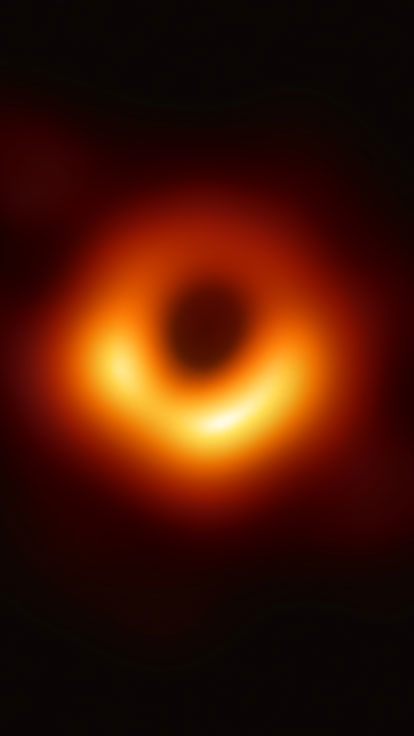

Original x2
/content/MyImages/blackhole.png


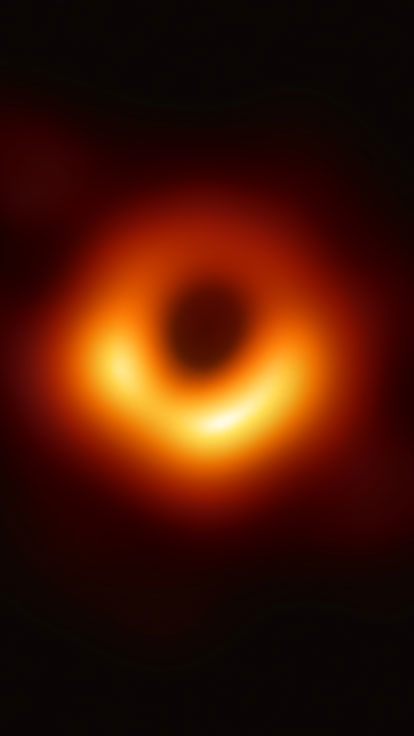

/content/Myresults/output_edsr_x2/blackhole-sr.png


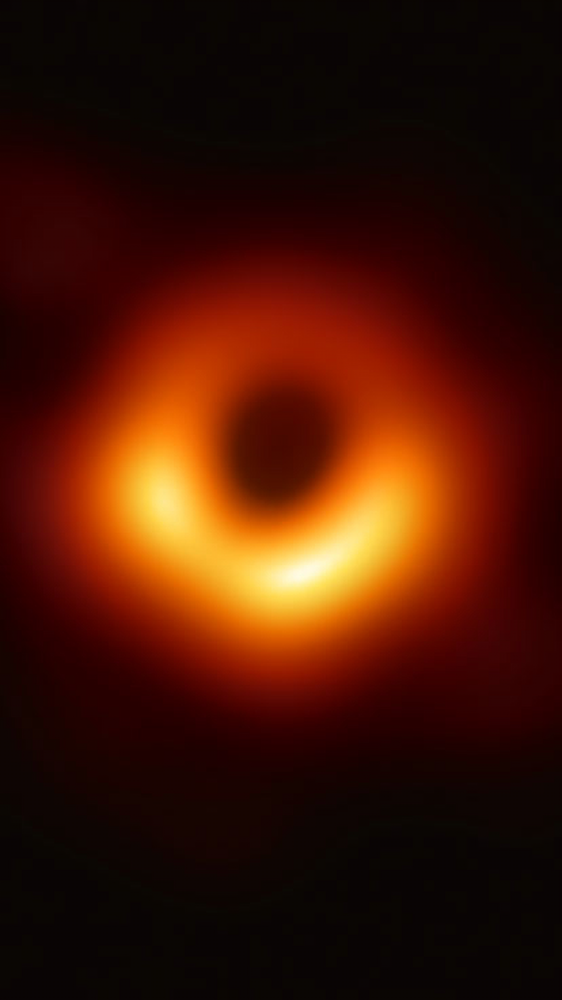

/content/Myresults/output_wdsr_x2/blackhole-sr.png


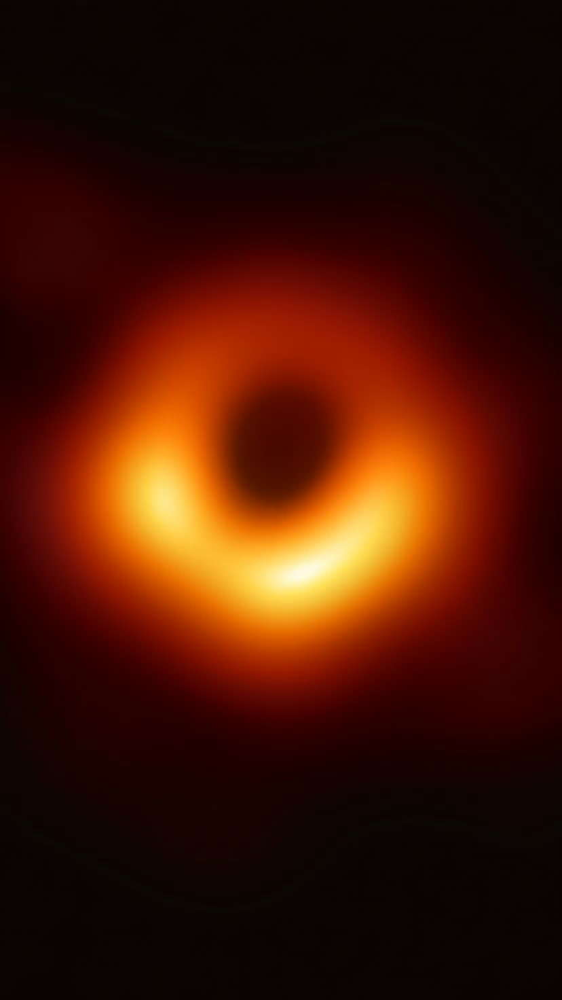

Original x4
/content/MyImages/blackhole.png


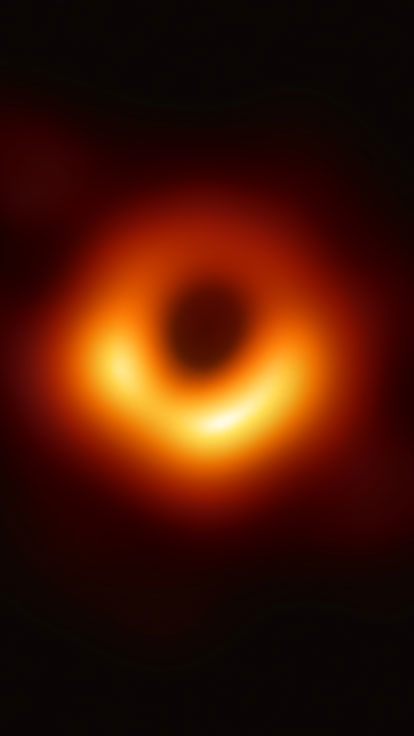

/content/Myresults/output_wdsr_x4/blackhole-sr.png


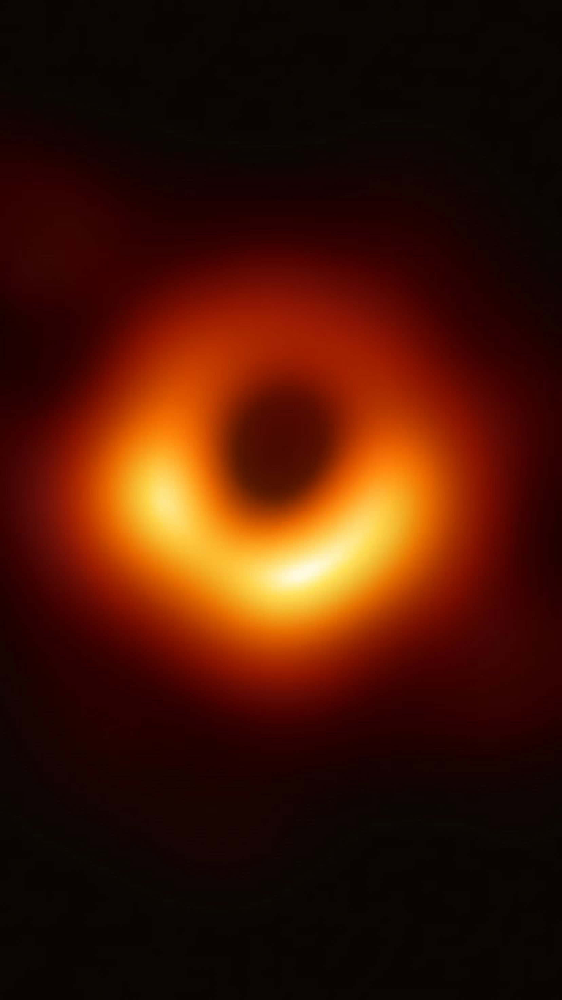

/content/Myresults/srgan_x4/blackhole-sr.png


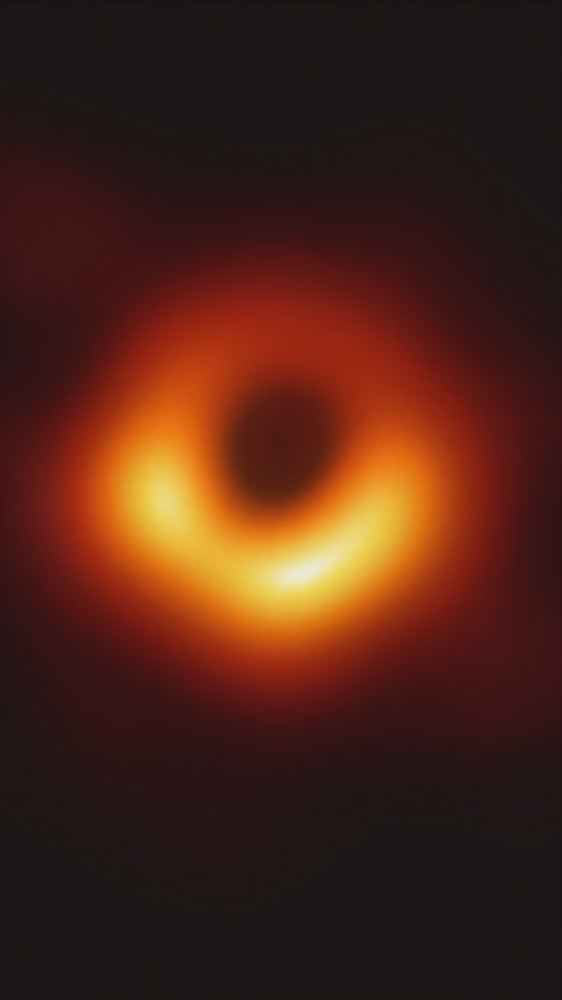

/content/Myresults/ESRGAN_PSNR_x4/blackhole_rlt.png


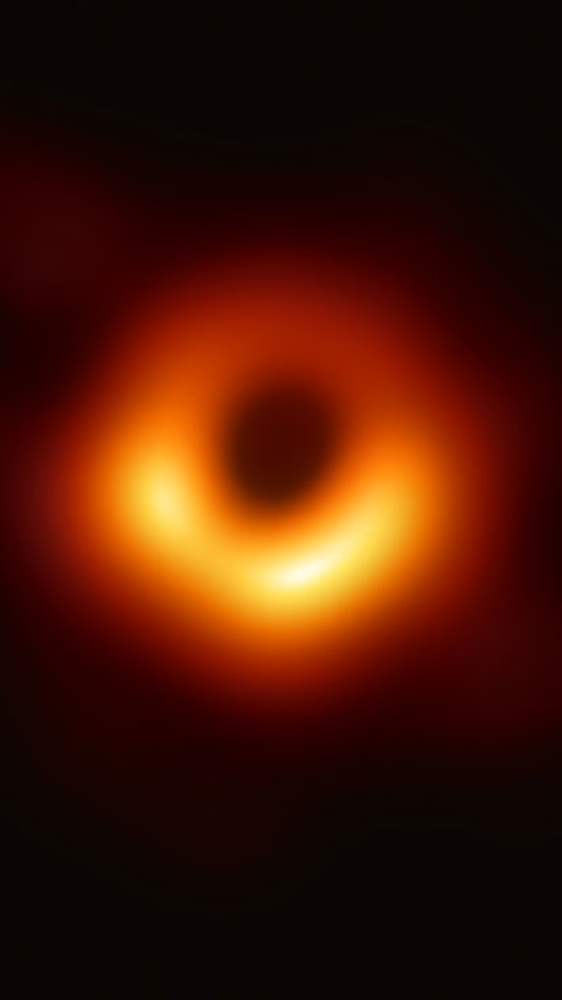

/content/Myresults/ESRGAN_x4/blackhole_rlt.png


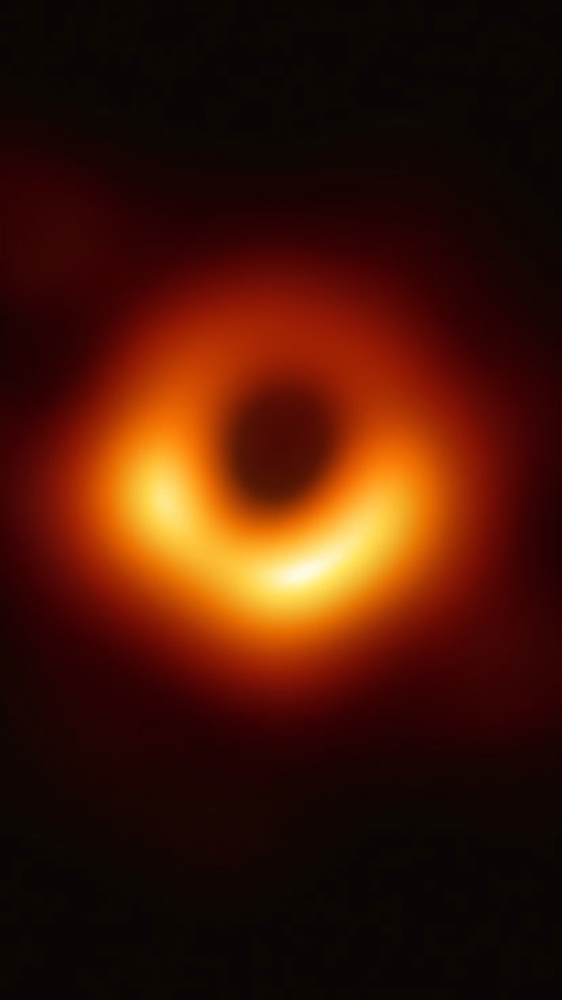

In [18]:
from IPython.display import Image, display
import PIL
import glob

#you can change the name of the image to display (without extension)
imname = 'blackhole'
imname = imname+'*'

#dirsx2 = ['/content/Myresults/output_wdsr_x2/']
#dirsx2 = glob.glob('/content/Myresults/*x2*/')
#dirsx3 = glob.glob('/content/Myresults/*x3*/')
#dirsx4 = glob.glob('/content/Myresults/*x4*/')
#dirsx4 = ['/content/Myresults/output_wdsr_x4/', '/content/Myresults/srgan_x4/', '/content/Myresults/ESRGAN/', '/content/Myresults/ESRGAN_PSNR/']


#Original
print('Original')

orignames = glob.glob('/content/MyImages/' + imname)
for filename in orignames:
  print(filename)
  display(Image(filename))



#For each scaling index, display original resized image, and model results
for scaling in range(2,10):
  sc = scaling
  ssc = str(scaling)
  dirs = glob.glob('/content/Myresults/*x' + ssc + '*/')
  
  if dirs:
    print('Original x' + ssc)
    for filename in orignames:
      print(filename)
      im = PIL.Image.open(filename)
      width, height = im.size
      display(Image(filename, width=int(width*sc), height = int(height*sc) ))
    
    #Super-resolution results
    for mydir in dirs: 
      try:
        filenames = glob.glob(mydir + imname)
        for filename in filenames:
          print(filename)
          display(Image(filename))
      except:
        print('error on ' + mydir + ' for name ' + imname)


# Conclusions
WDSR et DBPN (deux gagnants de NTIRE2018) sont pas trop mauvais.
Le plus récent SRFBN est assez comparable avec la dégradation de t ype BI. Avec la dégradation DN il lisse très fort, et avec la dégradation BD il ajoute du bruit sur mes photos. (La dégradation à utiliser dépend de l'image d'entrée).

# Benchmark rankings
This link shows rankings of various models for different benchmark datasets: https://paperswithcode.com/task/image-super-resolution
You can check which dataset fits your needs the most. For instance, BSD100 seems to include some nature landscape images. As of today (02/05/2019), ESRGAN seems the most efficient model based on the PSNR metric.

However, the PSNR metric doesn't take into account the realistic impression of the reconstruction (which is the goal of a GAN model). Moreover, the quality of a reconstruction may vary a lot from an image to another and the best way is still to visually (and hence subjectively...) compare different methods.

# Other tests

## Fast and Efficient Image Quality Enhancement via Desubpixel Convolutional Neural Networks
https://github.com/thangvubk/FEQE

In [0]:
import os
os.chdir('/content')
!git clone https://github.com/thangvubk/FEQE

Cloning into 'FEQE'...
remote: Enumerating objects: 1059, done.
remote: Total 1059 (delta 0), reused 0 (delta 0), pack-reused 1059
Receiving objects: 100% (1059/1059), 67.40 MiB | 27.52 MiB/s, done.
Resolving deltas: 100% (118/118), done.


In [0]:
import os
os.chdir('/content/FEQE')

In [0]:
ls

checkpoint/  docs/    model/     results/  train.py  vgg_pretrained/
data/        LICENSE  README.md  test.py   utils.py


In [0]:
!mkdir ./checkpoint/FEQE
!mkdir ./checkpoint/FEQE_P

Put your images in folder data/test_benchmark/Myimages
download a pretrained model (chek github page) and put it in checkpoint folder

In [0]:
!pip install tensorflow>=1.10
!pip install tensorlayer>=1.9
#!pip install tensorboardX>=1.4
!pip install numpy>=1.15

In [0]:
!pip install --upgrade tensorlayer
!pip install --upgrade numpy

Requirement already up-to-date: tensorlayer in /usr/local/lib/python3.6/dist-packages (1.11.1)
  Using cached https://files.pythonhosted.org/packages/c1/e2/4db8df8f6cddc98e7d7c537245ef2f4e41a1ed17bf0c3177ab3cc6beac7f/numpy-1.16.3-cp36-cp36m-manylinux1_x86_64.whl
yellowbrick 0.9.1 has requirement scikit-learn>=0.20, but you'll have scikit-learn 0.19.2 which is incompatible.
tensorlayer 1.11.1 has requirement numpy<1.16,>=1.14, but you'll have numpy 1.16.3 which is incompatible.
tensorflow 1.10.0 has requirement numpy<=1.14.5,>=1.13.3, but you'll have numpy 1.16.3 which is incompatible.
magenta 0.3.19 has requirement tensorflow>=1.12.0, but you'll have tensorflow 1.10.0 which is incompatible.
imbalanced-learn 0.4.3 has requirement scikit-learn>=0.20, but you'll have scikit-learn 0.19.2 which is incompatible.
datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imga

In [0]:
#resize images so that they have a pair numbre of pixels in width and height

from PIL import Image
import os, sys
import numpy as pn

path = '/content/Myimages/'
dirs = os.listdir( path )

def resize():
  for item in dirs:
    print(path+item)
    if os.path.isfile(path+item):
        im = Image.open(path+item)
        f, e = os.path.splitext(path+item)
        width, height = im.size
        width2 = np.round(width/2)*2
        height2 = np.round(height/2)*2
        imResize = im.resize((int(width2),int(height2)), Image.ANTIALIAS)
        imResize.save(path+item, quality=90)

resize()

/content/FEQE/data/test_benchmark/Myimages/niagarasmall.png
/content/FEQE/data/test_benchmark/Myimages/me2.png
/content/FEQE/data/test_benchmark/Myimages/SAM_5145.png
/content/FEQE/data/test_benchmark/Myimages/.ipynb_checkpoints


In [0]:
from PIL import Image
import os, sys

path = '/content/Myimages/'
dirs = os.listdir( path )

item = dirs[0]
if os.path.isfile(path+item):
  print('salut')
  im = Image.open(path+item)
  f, e = os.path.splitext(path+item)
        
print(path+item)        
os.path.isfile(path+item)
width, height = im.size

import numpy as np
tmp = 17
np.round(tmp/2)*2

print(width,height)

width2 = np.round(width/2)*2
height2 = np.round(height/2)*2

print(width2,height2)

imResize = im.resize((int(width2),int(height2)), Image.ANTIALIAS)

neww, newh = imResize.size
print(neww,newh)
imResize.size
print(f, e)

print(path+item)

#imResize.save(path+item, quality=90)

salut
/content/FEQE/data/test_benchmark/Myimages/niagarasmall.png
256 256
256.0 256.0
256 256
/content/FEQE/data/test_benchmark/Myimages/niagarasmall .png
/content/FEQE/data/test_benchmark/Myimages/niagarasmall.png


In [0]:
#images need to be resized to a pair number of pixels



import os
os.chdir('/content/FEQE')
!python test.py --dataset Myimages

############################################################
# Image Super Resolution - PIRM2018 - TEAM_ALEX            #
# Implemented by Thang Vu, thangvubk@gmail.com             #
############################################################

_____________YOUR SETTINGS_____________
          model_path: checkpoint/FEQE/model.ckpt
           save_path: results
             dataset: Myimages
     downsample_type: desubpixel
       upsample_type: subpixel
           conv_type: default
           body_type: resnet
             n_feats: 16
            n_blocks: 20
            n_groups: 0
             n_convs: 0
          n_squeezes: 0
               scale: 4

Loading data...
Loading model...
2019-04-29 11:57:14.304451: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
[TL] WARNING: Function: `tensorlayer.layers.utils.initialize_global_variables` (in file: /usr/local/lib/python3.6/dist-packages/

In [0]:
!pip uninstall -y numpy
!pip install numpy

Uninstalling numpy-1.15.4:
  Would remove:
    /usr/local/bin/f2py
    /usr/local/lib/python3.6/dist-packages/numpy-1.15.4.dist-info/*
    /usr/local/lib/python3.6/dist-packages/numpy/*
Proceed (y/n)? y
  Successfully uninstalled numpy-1.15.4
    100% |████████████████████████████████| 17.3MB 2.6MB/s 
tensorlayer 1.11.1 has requirement numpy<1.16,>=1.14, but you'll have numpy 1.16.3 which is incompatible.
datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.8 which is incompatible.


## SRGAN Tensorflow
https://github.com/brade31919/SRGAN-tensorflow

In [0]:
import os
os.chdir('/content')
!git clone https://github.com/brade31919/SRGAN-tensorflow

In [0]:
import os
os.chdir('/content/SRGAN-tensorflow')

In [0]:
!wget -O "pretrained.tar" "https://doc-0o-0k-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/g5mne2jlccp4nelji8lob74afqsgqq7m/1556546400000/15273277620477648564/*/0BxRIhBA0x8lHNDJFVjJEQnZtcmc?e=download"

In [0]:
!tar xvf pretrained.tar

In [0]:
!ls

In [0]:
!python main.py \
    --output_dir ./result/ \
    --summary_dir ./result/log/ \
    --mode inference \
    --is_training False \
    --task SRGAN \
    --input_dir_LR ../MyImages/ \
    --num_resblock 16 \
    --perceptual_mode VGG54 \
    --pre_trained_model True \
--checkpoint ./SRGAN_pre-trained/model-200000

## EPSR
https://github.com/subeeshvasu/2018_subeesh_epsr_eccvw/tree/master/EPSR_testcode

In [0]:
import os
os.chdir('/content')
!git clone "https://github.com/subeeshvasu/2018_subeesh_epsr_eccvw"

Cloning into '2018_subeesh_epsr_eccvw'...
remote: Enumerating objects: 3, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 335 (delta 0), reused 0 (delta 0), pack-reused 332
Receiving objects: 100% (335/335), 4.09 MiB | 37.35 MiB/s, done.
Resolving deltas: 100% (133/133), done.


In [0]:
import os
os.chdir('/content/2018_subeesh_epsr_eccvw')

In [0]:
!wget -O "EPSR.zip" "https://doc-0c-68-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/e69qff8opc3g8hh5iu5eu8eia3se8ajt/1556733600000/06467105461595922124/*/1zcV8lkykmWiTRv46Kdxep60TBB0Ri-n9?e=download"

--2019-05-01 18:35:51--  https://doc-0c-68-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/e69qff8opc3g8hh5iu5eu8eia3se8ajt/1556733600000/06467105461595922124/*/1zcV8lkykmWiTRv46Kdxep60TBB0Ri-n9?e=download
Resolving doc-0c-68-docs.googleusercontent.com (doc-0c-68-docs.googleusercontent.com)... 74.125.141.132, 2607:f8b0:400c:c06::84
Connecting to doc-0c-68-docs.googleusercontent.com (doc-0c-68-docs.googleusercontent.com)|74.125.141.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘EPSR.zip’

EPSR.zip                [              <=>   ] 456.95M   170MB/s    in 2.7s    

2019-05-01 18:35:54 (170 MB/s) - ‘EPSR.zip’ saved [479150607]



In [0]:
!unzip "EPSR.zip"

Archive:  EPSR.zip
   creating: EPSR_models/
  inflating: EPSR_models/epsr1_model.pt  
  inflating: EPSR_models/epsr2_model.pt  
  inflating: EPSR_models/epsr3_model.pt  


In [0]:
#needed for EPSR
!pip install torch==0.4.1 -f https://download.pytorch.org/whl/cu100/stable

Looking in links: https://download.pytorch.org/whl/cu100/stable
     |████████████████████████████████| 519.5MB 29kB/s 
ERROR: fastai 1.0.52 has requirement torch>=1.0.0, but you'll have torch 0.4.1 which is incompatible.
  Found existing installation: torch 1.0.1.post2
    Uninstalling torch-1.0.1.post2:
      Successfully uninstalled torch-1.0.1.post2


In [0]:
!python ./EPSR_testcode/code/main.py --data_test Demo --scale 4 --n_resblocks 32 --n_feats 256 --res_scale 0.1 --pre_train "./EPSR_models/epsr3_model.pt" --test_only --save_results --dir_data '/content' --dir_demo '/content/MyImages'

Making model...
Loading model from ./EPSR_models/epsr3_model.pt

Evaluation:
  0%|                                                     | 0/3 [00:00<?, ?it/s]torch.Size([1, 3, 768, 1024])
THCudaCheck FAIL file=/pytorch/aten/src/THC/THCGeneral.cpp line=663 error=11 : invalid argument
Traceback (most recent call last):
  File "./EPSR_testcode/code/main.py", line 17, in <module>
    t.test()
  File "/content/2018_subeesh_epsr_eccvw/EPSR_testcode/code/trainer.py", line 96, in test
    sr = self.model(lr, idx_scale)
  File "/usr/local/lib/python3.6/dist-packages/torch/nn/modules/module.py", line 477, in __call__
    result = self.forward(*input, **kwargs)
  File "/content/2018_subeesh_epsr_eccvw/EPSR_testcode/code/model/__init__.py", line 54, in forward
    return self.model(x)
  File "/usr/local/lib/python3.6/dist-packages/torch/nn/modules/module.py", line 477, in __call__
    result = self.forward(*input, **kwargs)
  File "/content/2018_subeesh_epsr_eccvw/EPSR_testcode/code/model/edsr.py",